In [1]:
import pandas as pd
import numpy as np
import psycopg2 # needed to get database exception errors when uploading dataframe
import requests # package for getting data from the web
from zipfile import * # package for unzipping zip files
import sql_functions as sqlf

In [2]:
schema = 'capstone_organicfood'
table_name = 'concatenated_laying_hens'

In [3]:
df_layers = sqlf.get_dataframe(f'select * from {schema}.concatenated_laying_hens;')
df_layers

,Country,Year,quantity,quantity.1,product_category
0,Austria,2011,1.122.434,"19,8 %",Free range
1,Austria,2012,1.167.650,"19,8 %",Free range
2,Austria,2013,1.128.111,"18,9 %",Free range
3,Austria,2014,1.181.396,"19,5 %",Free range
4,Austria,2015,1.265.350,"20,0 %",Free range
...,...,...,...,...,...
987,Sweden,2017,1.353.469,"16,8 %",Organic
988,Sweden,2018,1.396.980,"16,1 %",Organic
989,Sweden,2019,1.442.545,"16,2 %",Organic
990,Sweden,2020,1.278.515,"14,7 %",Organic


In [4]:
df_layers.head(40)

,Country,Year,quantity,quantity.1,product_category
0,Austria,2011,1.122.434,"19,8 %",Free range
1,Austria,2012,1.167.650,"19,8 %",Free range
2,Austria,2013,1.128.111,"18,9 %",Free range
3,Austria,2014,1.181.396,"19,5 %",Free range
4,Austria,2015,1.265.350,"20,0 %",Free range
5,Austria,2016,1.404.792,"21,4 %",Free range
6,Austria,2017,1.499.623,"22,3 %",Free range
7,Austria,2018,1.605.622,"23,5 %",Free range
8,Austria,2019,1.731.302,"25,0 %",Free range
9,Austria,2020,1.884.864,"26,5 %",Free range


In [5]:
df_layers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 992 entries, 0 to 991
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Country           992 non-null    object
 1   Year              992 non-null    int64 
 2   quantity          992 non-null    object
 3   quantity.1        992 non-null    object
 4   product_category  992 non-null    object
dtypes: int64(1), object(4)
memory usage: 38.9+ KB


In [6]:
# Convert 'quantity' to numeric, removing periods for thousand separators
df_layers['quantity'] = df_layers['quantity'].str.replace('.', '').astype(int)

In [7]:
# Convert 'quantity.1' to numeric, replacing commas with periods for decimal separators and removing percentage sign
df_layers['quantity.1'] = df_layers['quantity.1'].str.rstrip('%').str.replace(',', '.').astype(float)

In [8]:
df_layers.describe()

,Year,quantity,quantity.1
count,992.000000,9.920000e+02,992.000000
mean,2016.455645,3.147622e+06,24.748589
std,2.938668,7.227249e+06,28.973683
min,2011.000000,0.000000e+00,0.000000
25%,2014.000000,5.457000e+04,2.175000
50%,2017.000000,6.464635e+05,10.700000
75%,2019.000000,2.521469e+06,43.950000
max,2021.000000,4.322909e+07,99.600000


In [9]:
print(df_layers['product_category'].value_counts())

product_category
Free range       248
Enriched cage    248
Barn             248
Organic          248
Name: count, dtype: int64


In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning

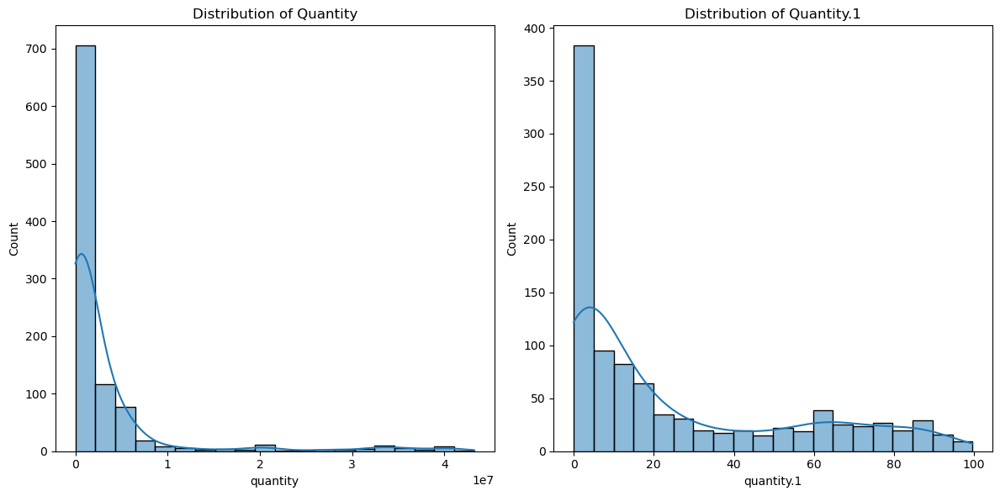

In [11]:
# Visualize distribution of 'quantity' and 'quantity.1'
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df_layers['quantity'], bins=20, kde=True)
plt.title('Distribution of Quantity')

plt.subplot(1, 2, 2)
sns.histplot(df_layers['quantity.1'], bins=20, kde=True)
plt.title('Distribution of Quantity.1')

plt.tight_layout()
plt.show()

/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


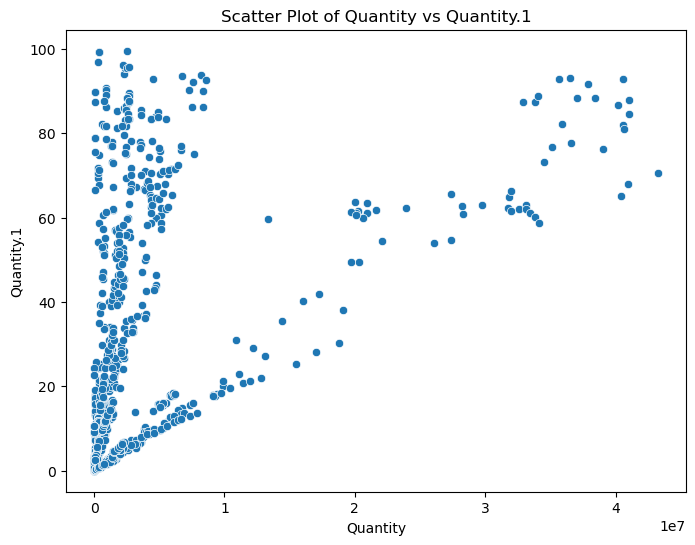

In [12]:
# Explore relationship between 'quantity' and 'quantity.1' with a scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_layers, x='quantity', y='quantity.1')
plt.title('Scatter Plot of Quantity vs Quantity.1')
plt.xlabel('Quantity')
plt.ylabel('Quantity.1')
plt.show()

/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


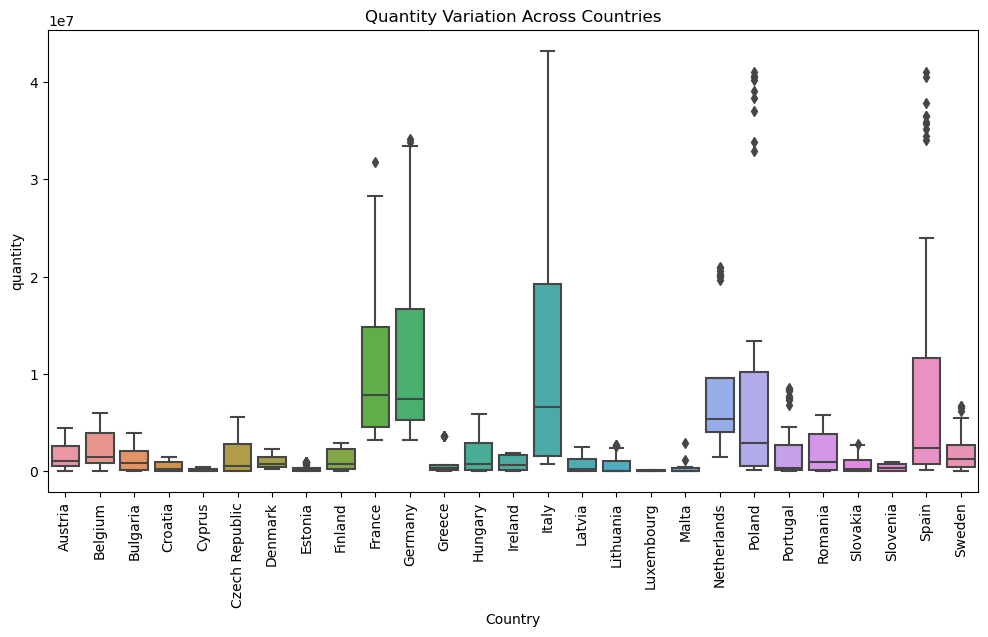

In [13]:
# Investigate how quantities vary across different countries and years
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_layers, x='Country', y='quantity')
plt.title('Quantity Variation Across Countries')
plt.xticks(rotation=90)
plt.show()

/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


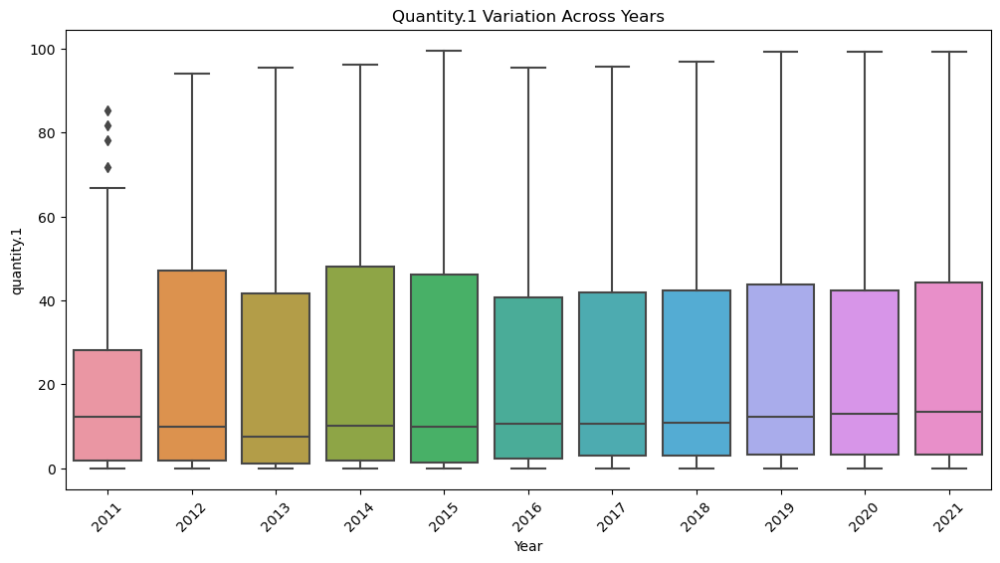

In [14]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_layers, x='Year', y='quantity.1')
plt.title('Quantity.1 Variation Across Years')
plt.xticks(rotation=45)
plt.show()

In [15]:
# Filter the DataFrame for 'Organic' product category and 'Non-Organic' product categories
organic_data = df_layers[df_layers['product_category'] == 'Organic']
non_organic_data = df_layers[df_layers['product_category'] != 'Organic']

In [16]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

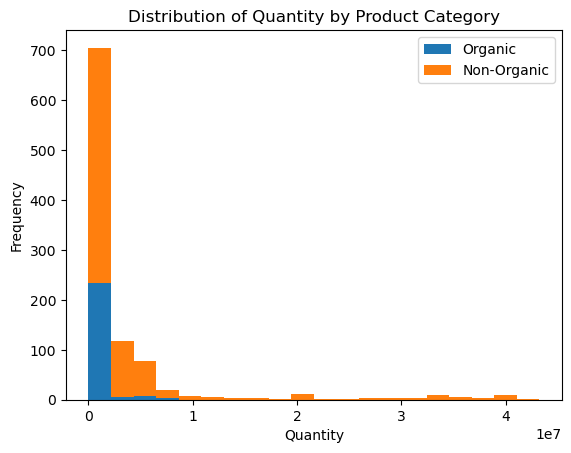

In [17]:
# Create stacked histogram for 'quantity'
plt.hist([organic_data['quantity'], non_organic_data['quantity']], bins=20, stacked=True, label=['Organic', 'Non-Organic'])
plt.title('Distribution of Quantity by Product Category')
plt.xlabel('Quantity')
plt.ylabel('Frequency')
plt.legend()

/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning

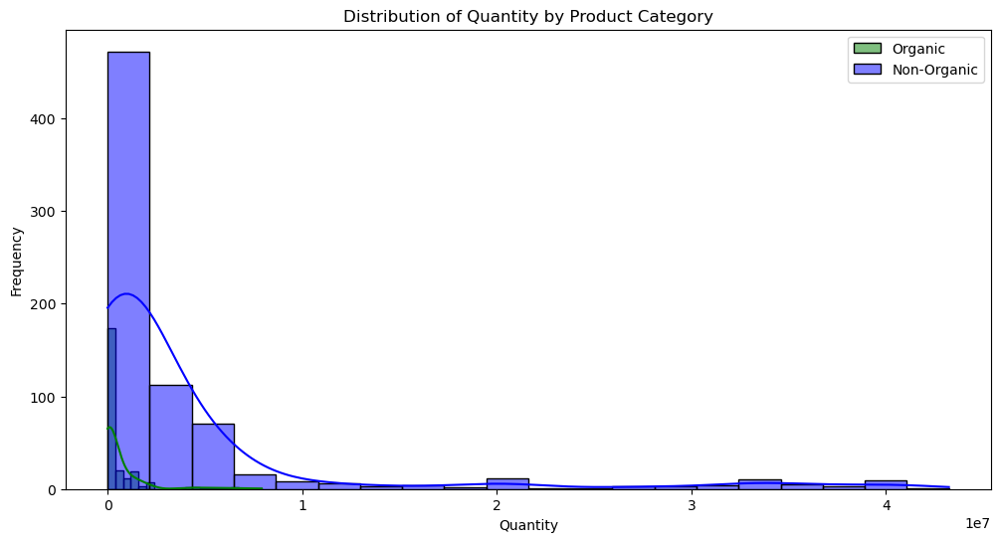

In [18]:
# Visualize the distribution of quantities for Organic and Non-Organic categories
plt.figure(figsize=(12, 6))
sns.histplot(organic_data['quantity'], bins=20, kde=True, color='green', label='Organic')
sns.histplot(non_organic_data['quantity'], bins=20, kde=True, color='blue', label='Non-Organic')
plt.title('Distribution of Quantity by Product Category')
plt.xlabel('Quantity')
plt.ylabel('Frequency')
plt.legend()
plt.show()

/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning

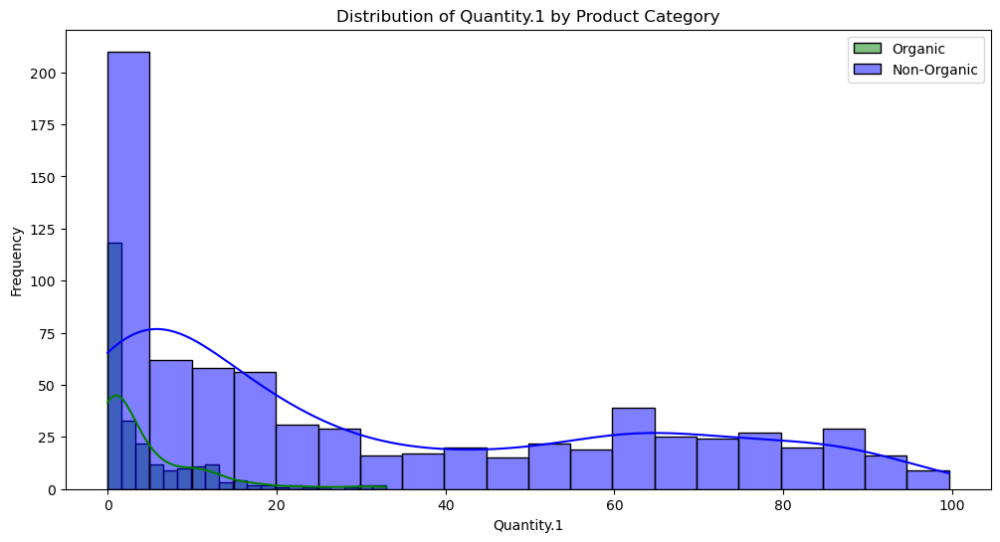

In [19]:
# Visualize the distribution of quantities.1 for Organic and Non-Organic categories
plt.figure(figsize=(12, 6))
sns.histplot(organic_data['quantity.1'], bins=20, kde=True, color='green', label='Organic')
sns.histplot(non_organic_data['quantity.1'], bins=20, kde=True, color='blue', label='Non-Organic')
plt.title('Distribution of Quantity.1 by Product Category')
plt.xlabel('Quantity.1')
plt.ylabel('Frequency')
plt.legend()
plt.show()


In [20]:
# Filter the DataFrame for 'Organic' product category
organic_data = df_layers[df_layers['product_category'] == 'Organic']

In [21]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/homebrew/Caskroom/miniconda/base/envs/nf_sql/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning

Text(0, 0.5, 'Quantity')

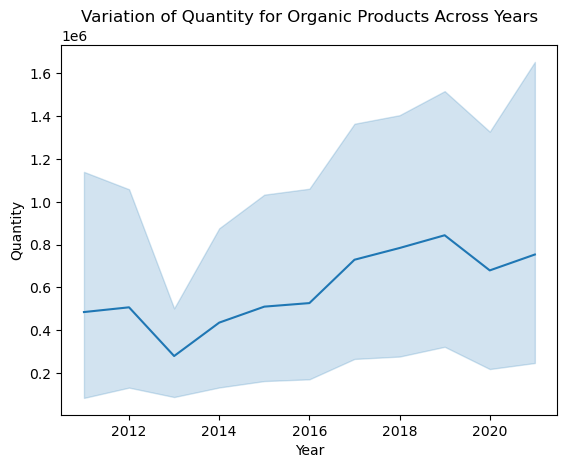

In [22]:
# Create line plot for 'quantity' across years
sns.lineplot(data=organic_data, x='Year', y='quantity')
plt.title('Variation of Quantity for Organic Products Across Years')
plt.xlabel('Year')
plt.ylabel('Quantity')


In [24]:
df_layers.dtypes

Country              object
Year                  int64
quantity              int64
quantity.1          float64
product_category     object
dtype: object

In [25]:
#perform trend analysis on each product category over the years in different countries
# Group data by product category and country
grouped = df_layers.groupby(['product_category', 'Country'])

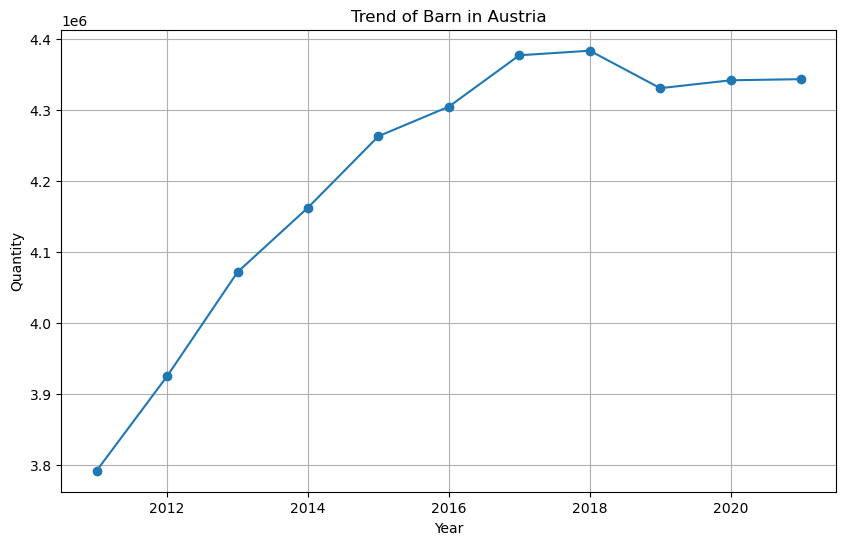

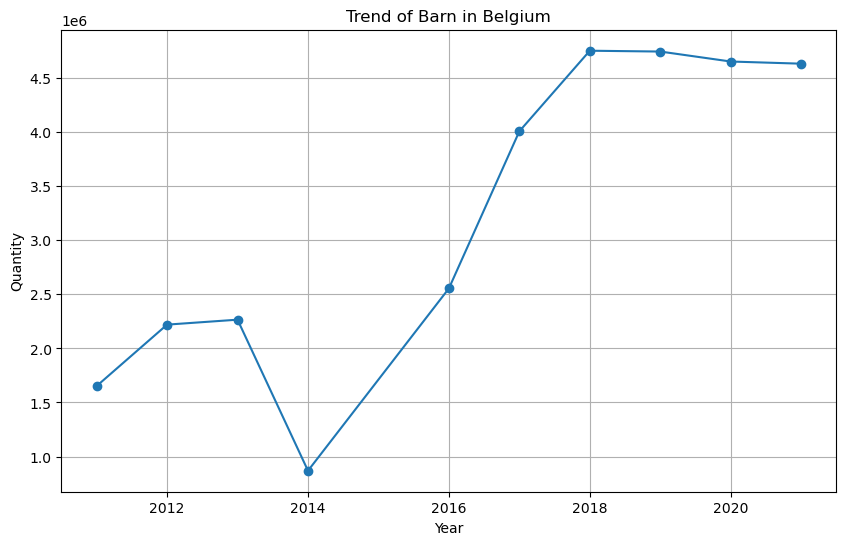

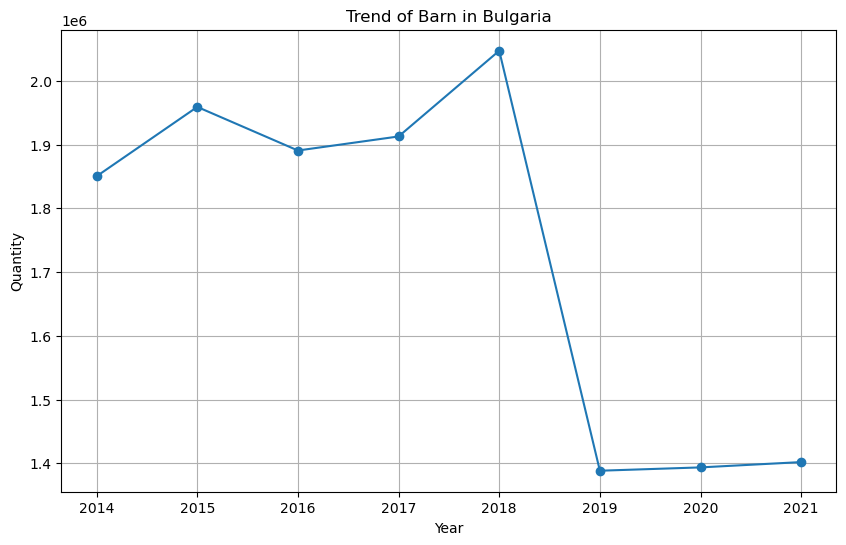

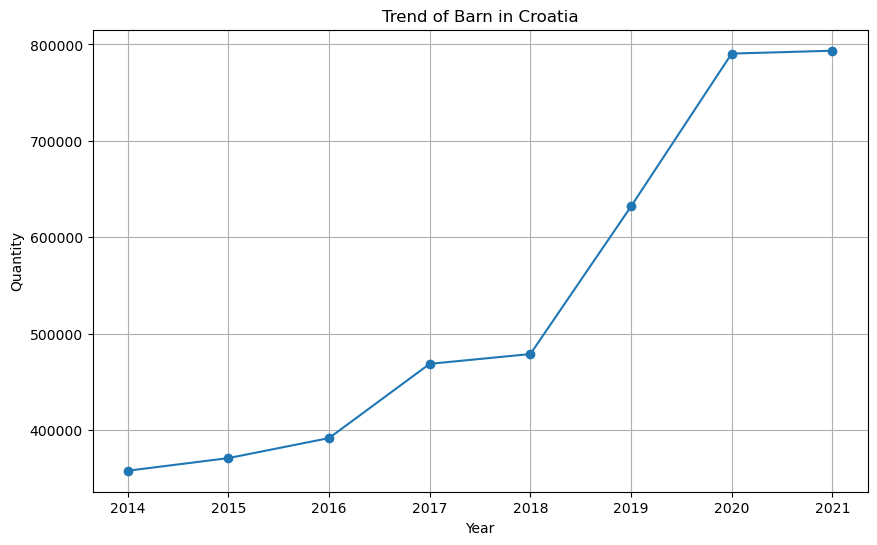

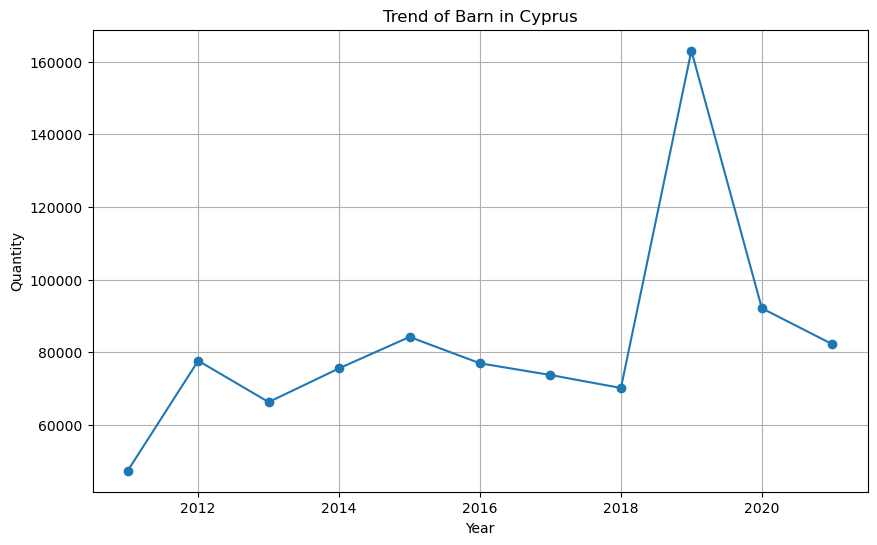

...

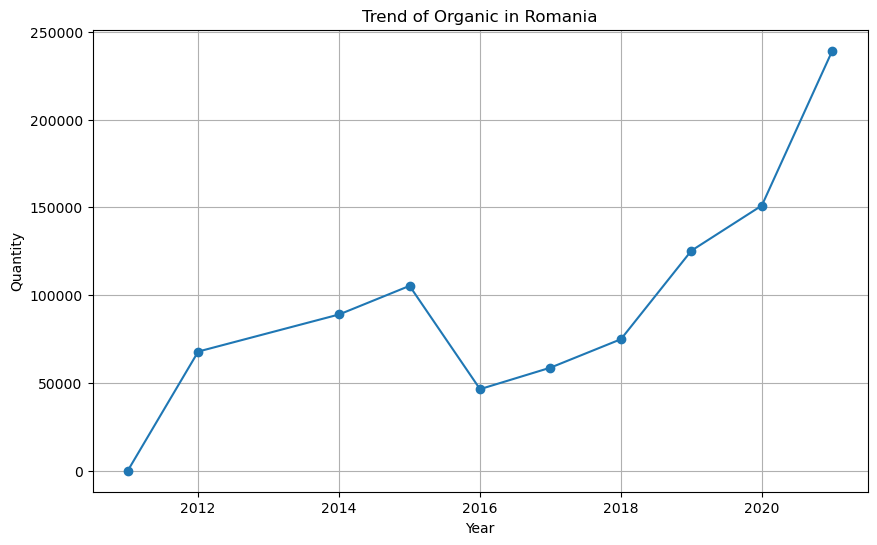

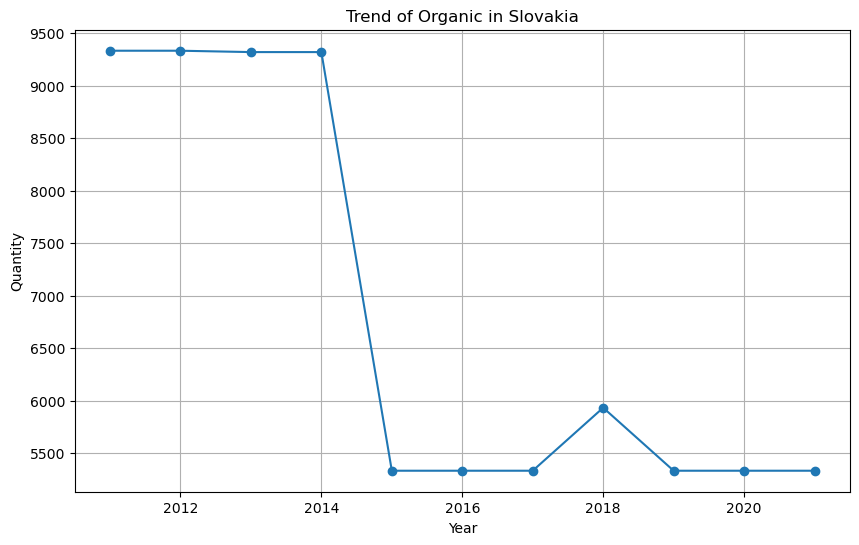

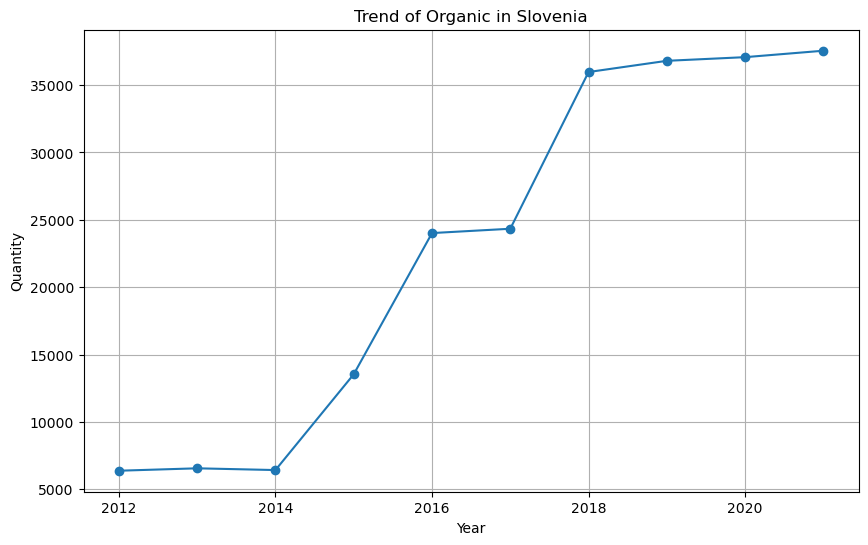

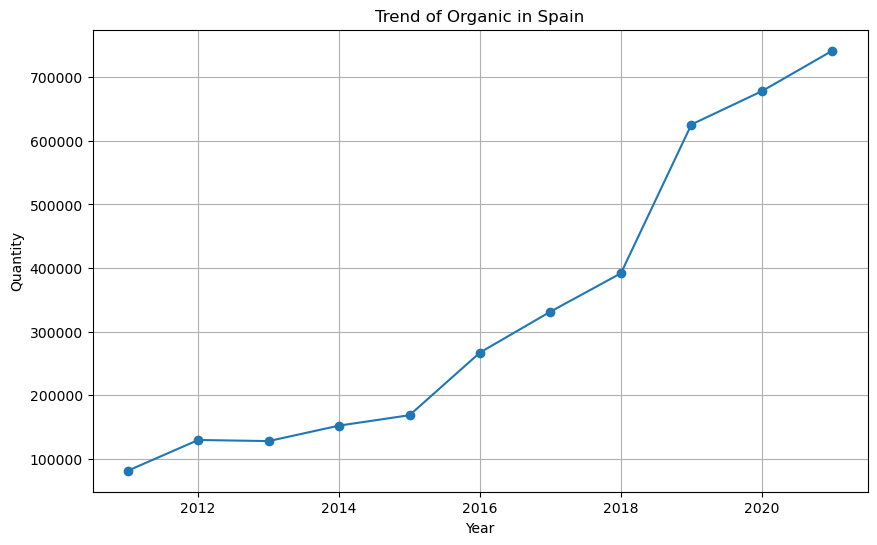

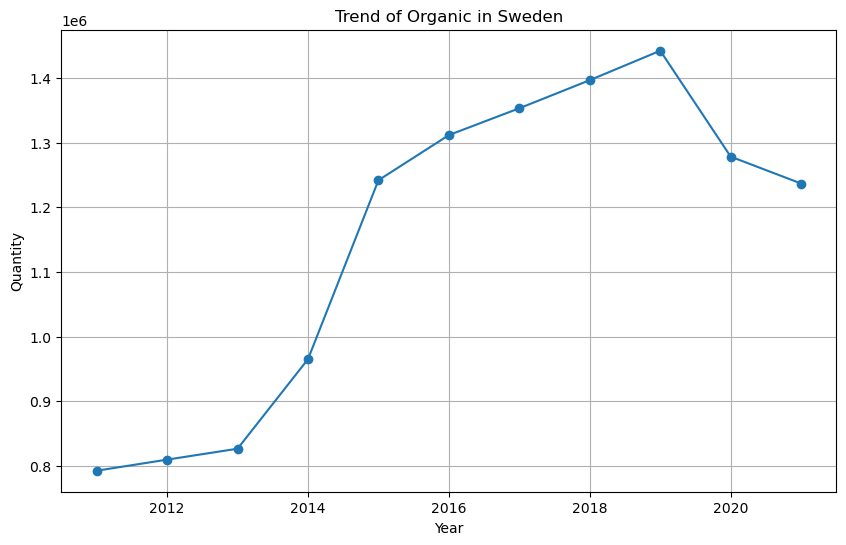

In [26]:
# Plot trend for each group
for group_name, group_data in grouped:
    category, country = group_name
    plt.figure(figsize=(10, 6))
    plt.plot(group_data['Year'], group_data['quantity'], marker='o')
    plt.title(f'Trend of {category} in {country}')
    plt.xlabel('Year')
    plt.ylabel('Quantity')
    plt.grid(True)
    plt.show()


In [27]:
#Compare the quantities of each product category across different countries to identify which countries have the highest or lowest usage of each category.
# Group data by product category and country, then sum quantities
grouped = df_layers.groupby(['product_category', 'Country'])['quantity'].sum().reset_index()

In [28]:
# Pivot the table to have countries as columns and product categories as rows
pivot_table = grouped.pivot(index='product_category', columns='Country', values='quantity')


<Figure size 1200x800 with 0 Axes>

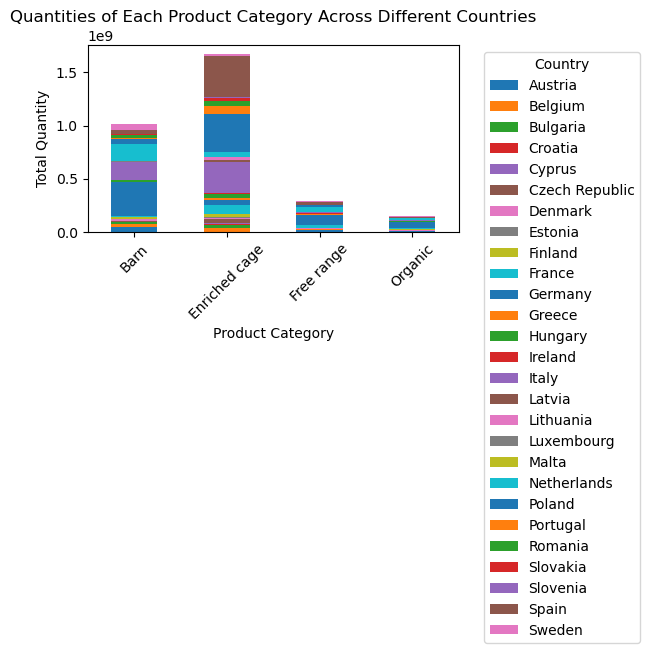

In [29]:
# Plotting
plt.figure(figsize=(12, 8))
pivot_table.plot(kind='bar', stacked=True)
plt.title('Quantities of Each Product Category Across Different Countries')
plt.xlabel('Product Category')
plt.ylabel('Total Quantity')
plt.xticks(rotation=45)
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [30]:
#Calculate the yearly growth rate for each product category in each country. Identify which categories are growing fastest in different regions.
# Group data by product category and country
grouped = df_layers.groupby(['product_category', 'Country'])


In [31]:
# Calculate yearly growth rate for each group
growth_rates = {}
for group_name, group_data in grouped:
    category, country = group_name
    # Sort data by year to ensure correct calculation of growth rates
    group_data = group_data.sort_values(by='Year')
    # Calculate percentage change in quantities from one year to the next
    group_data['growth_rate'] = group_data['quantity'].pct_change() * 100
    # Drop NaN values (resulting from the first year)
    group_data.dropna(inplace=True)
    growth_rates[group_name] = group_data

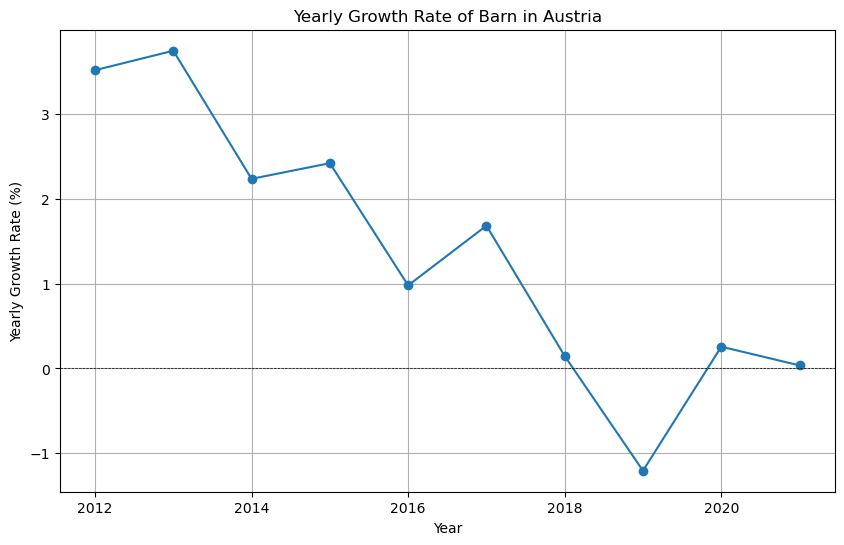

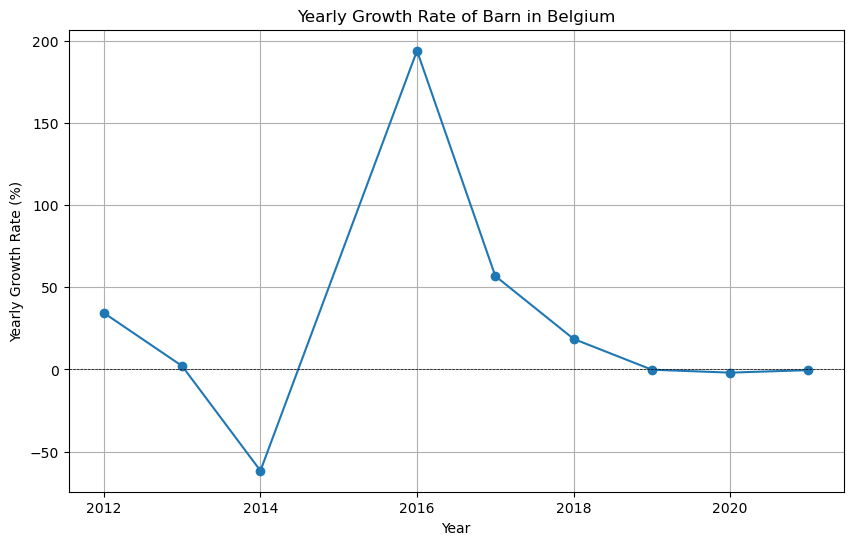

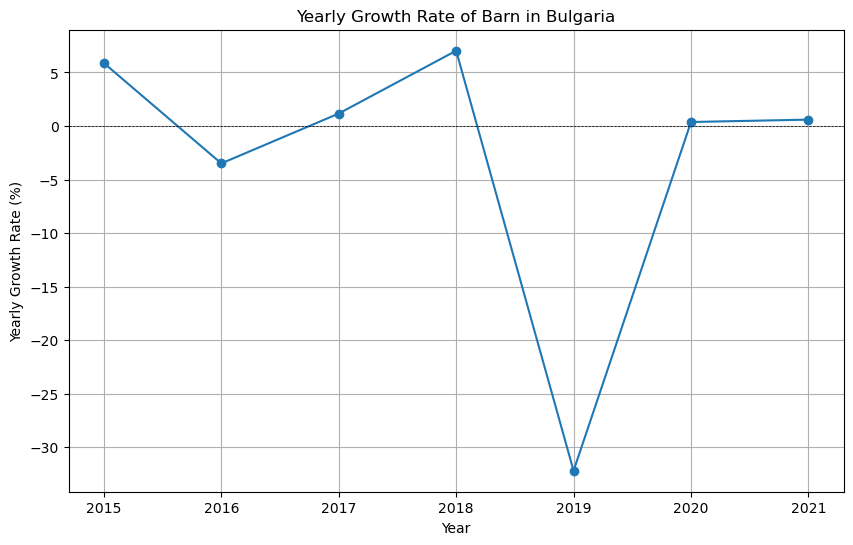

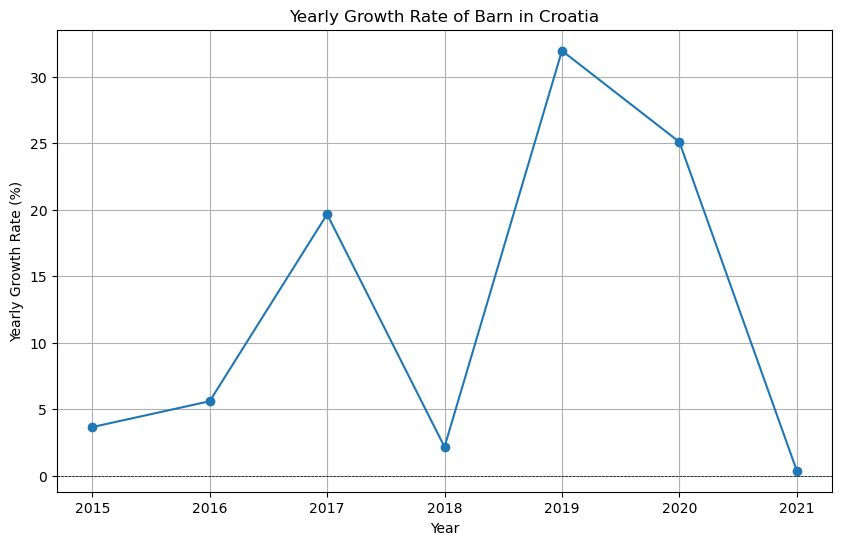

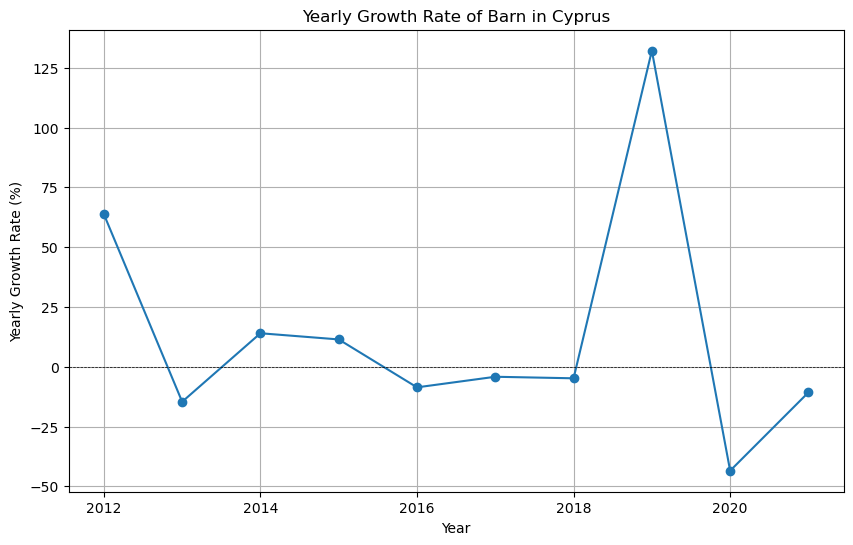

...

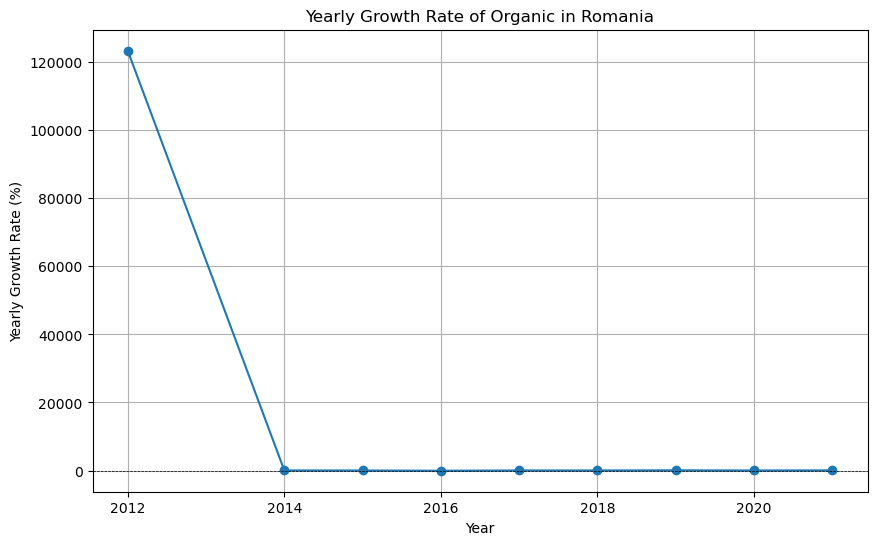

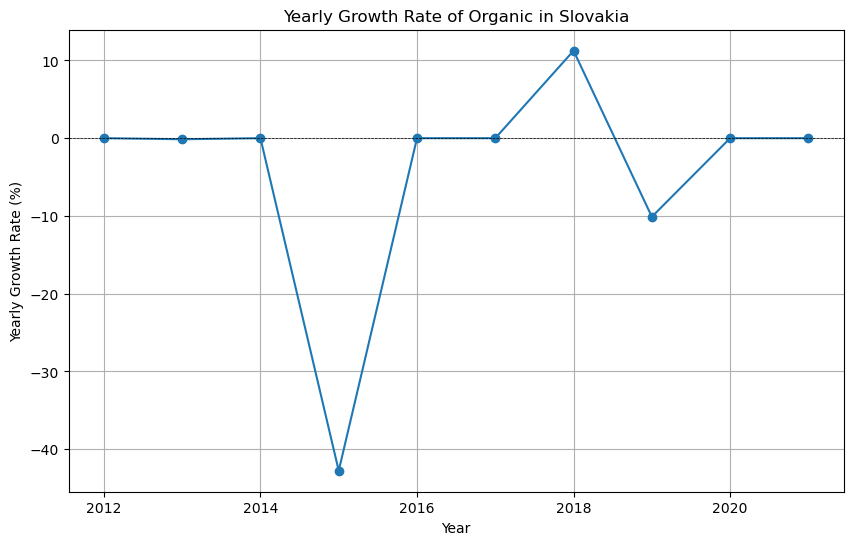

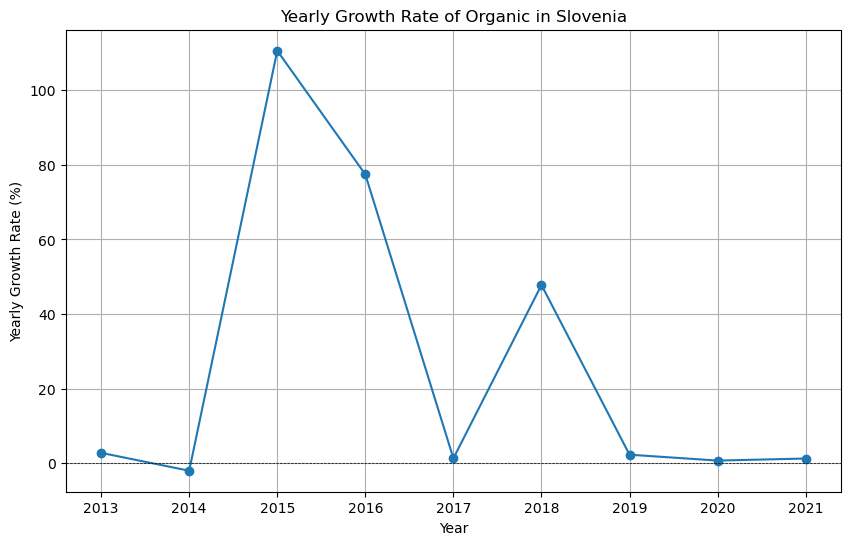

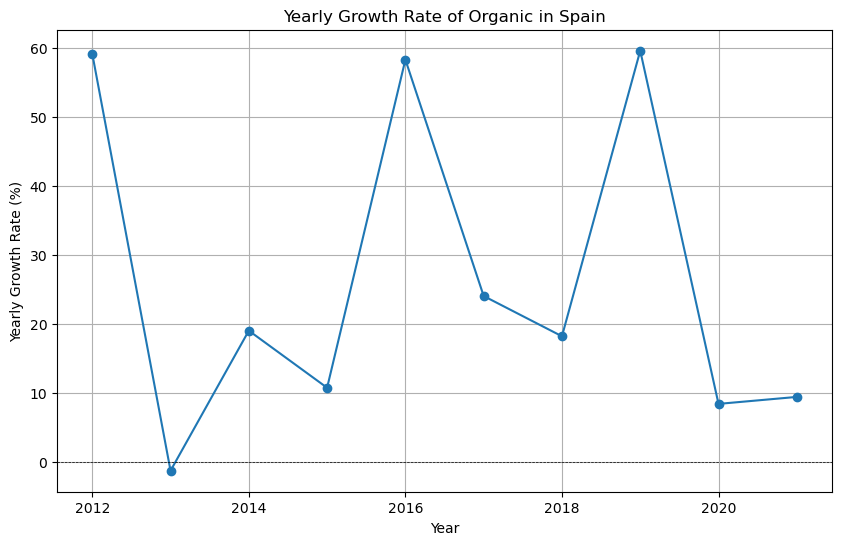

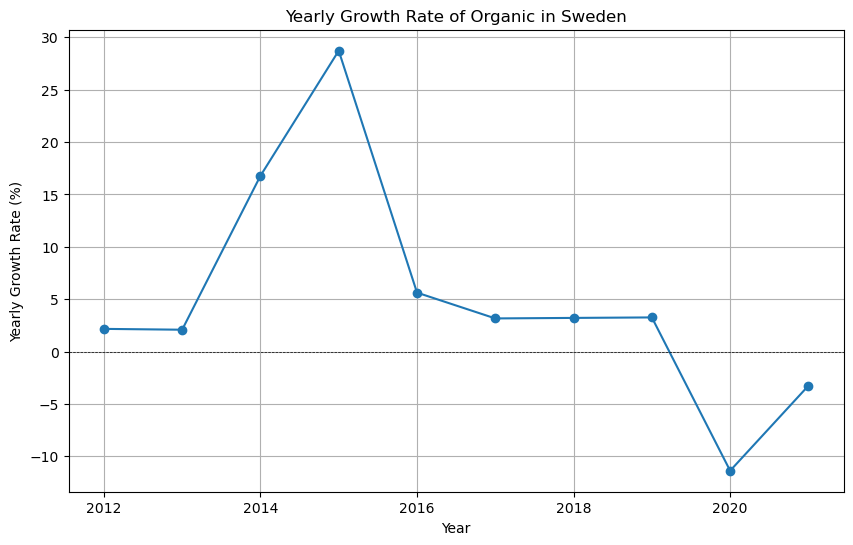

In [32]:
# Visualize growth rates
for group_name, group_data in growth_rates.items():
    category, country = group_name
    plt.figure(figsize=(10, 6))
    plt.plot(group_data['Year'], group_data['growth_rate'], marker='o')
    plt.title(f'Yearly Growth Rate of {category} in {country}')
    plt.xlabel('Year')
    plt.ylabel('Yearly Growth Rate (%)')
    plt.grid(True)
    plt.axhline(y=0, color='black', linestyle='--', linewidth=0.5)  # Add a horizontal line at 0
    plt.show()

In [33]:
#Explore correlations between product categories. Are there countries where the usage of one category is correlated with the usage of another category?
# Group data by Country and product_category, summing the quantities
grouped = df_layers.groupby(['Country', 'product_category'])['quantity'].sum().reset_index()


In [34]:
# Pivot the data to have product categories as columns and countries as rows
pivot_table = grouped.pivot(index='Country', columns='product_category', values='quantity').fillna(0)


In [35]:
# Calculate correlation matrix
correlation_matrix = pivot_table.corr()

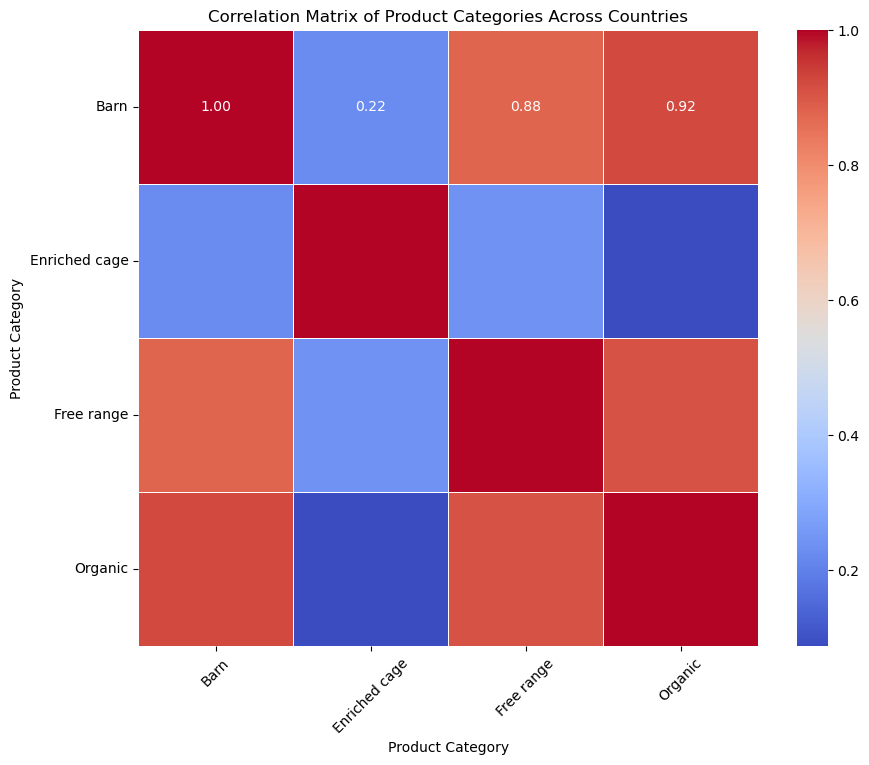

In [36]:
# Visualize correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Product Categories Across Countries')
plt.xlabel('Product Category')
plt.ylabel('Product Category')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

In [42]:
# Calculate yearly growth rate for each product category across all countries
df_layers['growth_rate'] = df_layers.groupby('product_category')['quantity'].pct_change() * 100


In [43]:
# Group data by product category and year, then calculate average growth rate for each year
grouped_growth = df_layers.groupby(['Year', 'product_category'])['growth_rate'].mean().unstack()


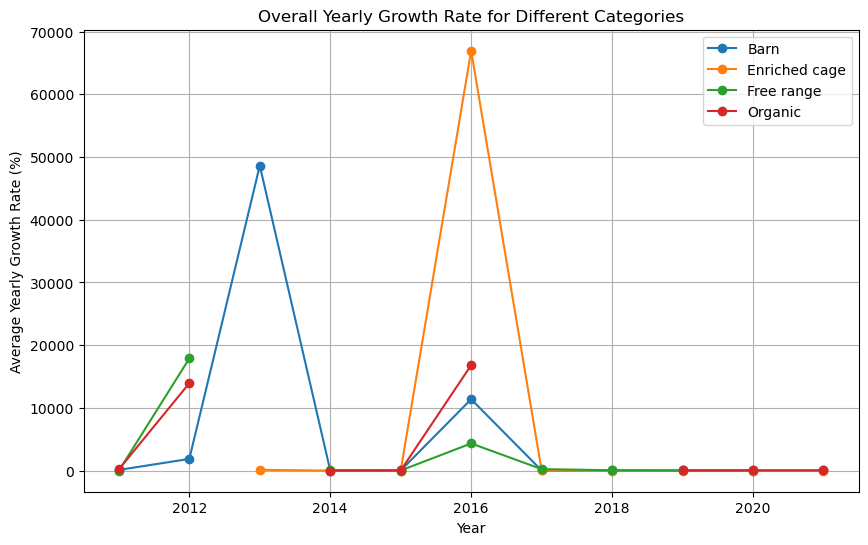

In [44]:
# Plot growth rates over time
plt.figure(figsize=(10, 6))
for category in grouped_growth.columns:
    plt.plot(grouped_growth.index, grouped_growth[category], label=category, marker='o')
    plt.title('Overall Yearly Growth Rate for Different Categories')
plt.xlabel('Year')
plt.ylabel('Average Yearly Growth Rate (%)')
plt.legend()
plt.grid(True)
plt.show()